In [1]:
from PIL import Image
import matplotlib.pyplot as plt 
import numpy as np
import time

import torch
import torch.nn
import torch.optim as optim
from torchvision import transforms, models

import HRNet
import utils

#from function import adaptive_instance_normalization, coral

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('------------------------------------------------------------------')
print(device)
print('------------------------------------------------------------------')

------------------------------------------------------------------
cuda
------------------------------------------------------------------


In [3]:
# get the VGG19's structure except the full-connect layers
VGG = models.vgg19(pretrained=True).features
VGG.to(device)
print(VGG)
# only use VGG19 to extract features, we don't need to change it's parameters
for parameter in VGG.parameters():
    parameter.requires_grad_(False)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [4]:
style_net = HRNet.HRNet()
style_net.to(device)
print(style_net)

HRNet(
  (pass1_1): BasicBlock(
    (relu): ReLU(inplace=True)
    (identity_block): Sequential(
      (0): ConvLayer(
        (conv): Conv2d(3, 4, kernel_size=(1, 1), stride=(1, 1))
      )
      (1): InstanceNorm2d(4, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU()
      (3): ConvLayer(
        (conv): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (4): InstanceNorm2d(4, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (5): ReLU()
      (6): ConvLayer(
        (conv): Conv2d(4, 16, kernel_size=(1, 1), stride=(1, 1))
      )
      (7): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (8): ReLU()
    )
    (shortcut): Sequential(
      (0): ConvLayer(
        (conv): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1))
      )
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    )
  )
  (pass1_2): BasicBlock(
    

In [5]:
#content_image = utils.load_image("../../final_project/data/0/0_content.png", img_size=500)  # temporary/content.png

#content_image = utils.load_image("../../final_project/data/0/12_0.jpg", img_size=500)
#content_image = content_image.to(device)

#try out a random image
content_image = utils.load_image("../../final_project/data/images.jpg", img_size=300)
content_image = content_image.to(device)


#Test = New Image
#style_image = utils.load_image("../../final_project/data/1/1_0.jpg")  # temporary/style.png
#style_image = style_image.to(device)

#Test = Flipped image/rotated image
im = Image.open("../../final_project/data/0/1_0.jpg")
im = im.rotate(180)
im.save("../../final_project/data/0/rotate.jpg")
style_image = utils.load_image("../../final_project/data/0/rotate.jpg", img_size=300)
style_image = style_image.to(device)

#style_image_2 = utils.load_image("../../final_project/data/3/1_0.jpg")  # temporary/style.png
#style_image_2 = style_image_2.to(device)


target_image = utils.load_image("../../final_project/data/0/1_0.jpg", img_size=300)  # temporary/style.png

In [6]:
import torch


def calc_mean_std(feat, eps=1e-5):
    # eps is a small value added to the variance to avoid divide-by-zero.
    size = feat.size()
    assert (len(size) == 4)
    N, C = size[:2]
    feat_var = feat.view(N, C, -1).var(dim=2) + eps
    feat_std = feat_var.sqrt().view(N, C, 1, 1)
    feat_mean = feat.view(N, C, -1).mean(dim=2).view(N, C, 1, 1)
    return feat_mean, feat_std


def adaptive_instance_normalization(content_feat, style_feat):
    assert (content_feat.size()[:2] == style_feat.size()[:2])
    size = content_feat.size()
    style_mean, style_std = calc_mean_std(style_feat)
    print("VARIANCE:",style_std.size())
    print("MEAN:",style_mean.size())
    print(style_mean)
    print(style_std)
    
    content_mean, content_std = calc_mean_std(content_feat)
    normalized_feat = (content_feat - content_mean.expand(
        size)) / content_std.expand(size)
    return normalized_feat * style_std.expand(size) + style_mean.expand(size)


def _calc_feat_flatten_mean_std(feat):
    # takes 3D feat (C, H, W), return mean and std of array within channels
    assert (feat.size()[0] == 3)
    assert (isinstance(feat, torch.FloatTensor))
    feat_flatten = feat.view(3, -1)
    mean = feat_flatten.mean(dim=-1, keepdim=True)
    std = feat_flatten.std(dim=-1, keepdim=True)
    return feat_flatten, mean, std


def _mat_sqrt(x):
    U, D, V = torch.svd(x)
    return torch.mm(torch.mm(U, D.pow(0.5).diag()), V.t())


def coral(source, target):
    # assume both source and target are 3D array (C, H, W)
    # Note: flatten -> f

    source_f, source_f_mean, source_f_std = _calc_feat_flatten_mean_std(source)
    source_f_norm = (source_f - source_f_mean.expand_as(
        source_f)) / source_f_std.expand_as(source_f)
    source_f_cov_eye = \
        torch.mm(source_f_norm, source_f_norm.t()) + torch.eye(3)

    target_f, target_f_mean, target_f_std = _calc_feat_flatten_mean_std(target)
    target_f_norm = (target_f - target_f_mean.expand_as(
        target_f)) / target_f_std.expand_as(target_f)
    target_f_cov_eye = \
        torch.mm(target_f_norm, target_f_norm.t()) + torch.eye(3)

    source_f_norm_transfer = torch.mm(
        _mat_sqrt(target_f_cov_eye),
        torch.mm(torch.inverse(_mat_sqrt(source_f_cov_eye)),
                 source_f_norm)
    )

    source_f_transfer = source_f_norm_transfer * \
                        target_f_std.expand_as(source_f_norm) + \
                        target_f_mean.expand_as(source_f_norm)

    return source_f_transfer.view(source.size())

In [138]:
import random 
import matplotlib.colors

samples = 100
s = random.sample(range(1,9000),samples)
Means = []
Variances = []
vectors = []
colors = []
times = 10
#time_array = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18]
time_array = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]
#for time in range(times):
for time in time_array:
    #Mean = []
    #Variance = []
    for i in s:
        style_image = utils.load_image("../../final_project/data/"+str(i)+"/"+str(time)+"_0.jpg")  # temporary/style.png
        style_image = style_image.to(device)
        style_feat = VGG(style_image)
        style_mean, style_std = calc_mean_std(style_feat)
        vec = torch.cat([style_mean.squeeze(0).squeeze(1).squeeze(1), style_std.squeeze(0).squeeze(1).squeeze(1)])
        #print(vec.shape) 
        #vec is a tensor of size 1024 - 512*2; mean = size 512; variance = 512;
        vectors.append(vec)
        #Mean.append(style_mean)
        #Variance.append(style_std)
    #Means.append(Mean)
    #Variances.append(Variance)
        #colors.append(num)
reps = torch.stack(vectors).cpu()


In [139]:
labels = []
for time in time_array:
    for i in range(samples):
        labels.append(time)
        colors.append(10+10*time)
print(len(vectors))
print(len(colors))
print(len(labels))

1000
1000
1000


In [140]:
vectors[0].shape

torch.Size([1024])

In [141]:
print(reps.shape)
print(len(reps))

torch.Size([1000, 1024])
1000


In [142]:
import numpy as np
from sklearn.manifold import TSNE
from sklearn import datasets
# Take the first 500 data points: it's hard to see 1500 points
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
X_2d = tsne.fit_transform(reps)

1000


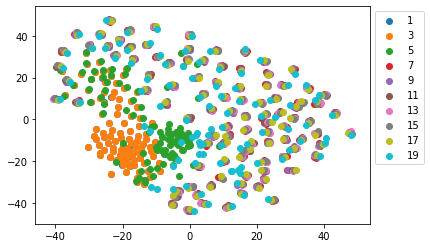

In [143]:
#X_2d
print(len(X_2d))
a = X_2d[:,0]
b = X_2d[:,1]
#plt.scatter(a, b, c=y_data, cmap=plt.cm.get_cmap("jet", 10))
#plt.scatter(a, b, c = labels, label = colors)
for i in range(times):
    plt.scatter(X_2d[i*samples:(i+1)*samples,0], X_2d[i*samples:(i+1)*samples,1], label = time_array[i])
plt.legend(bbox_to_anchor=(1,1), loc='upper left', ncol=1)
#plt.legend()
#plt.scatter(a, b, c = labels, labels = colors)
#plt.colorbar(ticks=range(10))
#plt.clim(-0.5, 9.5)
plt.show()

In [38]:
M.shape

(0,)

In [28]:
X.shape

(4, 3)

In [29]:
type(X)

numpy.ndarray

In [35]:
M

array([[tensor([[[[4.6282e-03]],

         [[0.0000e+00]],

         [[2.6696e-02]],

         [[1.8566e-02]],

         [[1.8002e-03]],

         [[1.3433e-01]],

         [[3.5622e-02]],

         [[6.7986e-02]],

         [[9.4364e-03]],

         [[8.9830e-03]],

         [[8.6637e-02]],

         [[1.4643e-02]],

         [[5.3766e-04]],

         [[2.6185e-03]],

         [[3.5474e-02]],

         [[6.2693e-02]],

         [[1.4582e-03]],

         [[0.0000e+00]],

         [[4.7716e-01]],

         [[5.0792e-03]],

         [[0.0000e+00]],

         [[4.6682e-02]],

         [[4.2557e-03]],

         [[0.0000e+00]],

         [[1.1762e-01]],

         [[0.0000e+00]],

         [[2.5846e-02]],

         [[0.0000e+00]],

         [[1.0877e-01]],

         [[3.1074e-03]],

         [[5.4959e-04]],

         [[4.9975e-02]],

         [[6.7689e-02]],

         [[3.0488e-03]],

         [[4.0112e-04]],

         [[9.0996e-02]],

         [[4.8090e-02]],

         [[1.4978e-03]],

    

In [30]:
type(M)

numpy.ndarray

In [26]:
X_embedded[:,0]

array([-55.114075, -15.657021, -82.47104 , -43.01437 ], dtype=float32)

In [ ]:
pca = PCA(n_components=5)
pca_result = pca.fit_transform()
df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
df['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
Explained variation per principal component: [0.09746116 0.07155445 0.06149531]

In [37]:
a = VGG(style_image)
b = VGG(content_image)
print(a.size())
print(b.size())
base_feat = adaptive_instance_normalization(b, a)

torch.Size([1, 512, 9, 9])
torch.Size([1, 512, 9, 9])
VARIANCE: torch.Size([1, 512, 1, 1])
MEAN: torch.Size([1, 512, 1, 1])
tensor([[[[2.6886e-01]],

         [[7.1531e-02]],

         [[3.3994e-02]],

         [[0.0000e+00]],

         [[1.6150e-01]],

         [[1.6477e-02]],

         [[3.1480e-02]],

         [[1.7247e-01]],

         [[3.4443e-02]],

         [[1.3482e-02]],

         [[1.9807e-01]],

         [[1.1025e-01]],

         [[9.1810e-02]],

         [[2.5925e-02]],

         [[3.7331e-01]],

         [[2.2181e-01]],

         [[4.5723e-03]],

         [[2.5187e-02]],

         [[5.3449e-01]],

         [[9.6312e-02]],

         [[1.7129e-01]],

         [[1.6682e-01]],

         [[5.8652e-02]],

         [[8.6026e-02]],

         [[5.8178e-01]],

         [[4.9881e-02]],

         [[2.2765e-01]],

         [[0.0000e+00]],

         [[3.5389e-01]],

         [[0.0000e+00]],

         [[1.1708e-01]],

         [[5.8719e-02]],

         [[7.1998e-02]],

         [[4.4986e

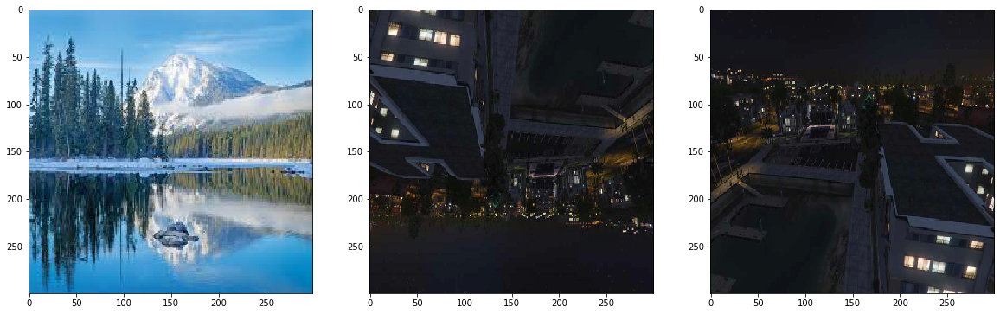

In [49]:
# display the raw images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(utils.im_convert(content_image))
ax2.imshow(utils.im_convert(style_image))
#ax3.imshow(utils.im_convert(style_image_2))
ax3.imshow(utils.im_convert(target_image))
plt.show()

In [50]:
content_features = utils.get_features(content_image, VGG)
style_features   = utils.get_features(style_image, VGG)
#style_features_2   = utils.get_features(style_image_2, VGG)
style_gram_matrixs = {layer: utils.get_grim_matrix(style_features[layer]) for layer in style_features}
#style_gram_matrixs_2 = {layer: utils.get_grim_matrix(style_features_2[layer]) for layer in style_features_2}
target = content_image.clone().requires_grad_(True).to(device)

In [51]:
# try to give fore con_layers more weight so that can get more detail in output iamge
style_weights = {'conv1_1': 0.1,
                 'conv2_1': 0.2,
                 'conv3_1': 0.4,
                 'conv4_1': 0.8,
                 'conv5_1': 1.6}

content_weight = 150
style_weight = 50

show_every = 100
optimizer = optim.Adam(style_net.parameters(), lr=5e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.9)
steps = 1000

content_loss_epoch = []
style_loss_epoch = []
total_loss_epoch = []
output_image = content_image

After 0 criterions:
Total loss:  1704.9951171875
Content loss:  5.143897533416748
Style loss:  18.668209075927734


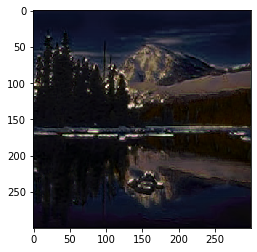

After 100 criterions:
Total loss:  542.1058349609375
Content loss:  1.8312878608703613
Style loss:  5.34825325012207


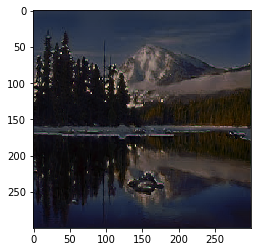

After 200 criterions:
Total loss:  445.45989990234375
Content loss:  1.4662309885025024
Style loss:  4.510504722595215


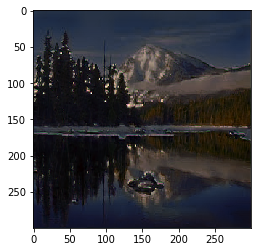

After 300 criterions:
Total loss:  445.87286376953125
Content loss:  1.3983572721481323
Style loss:  4.722385883331299


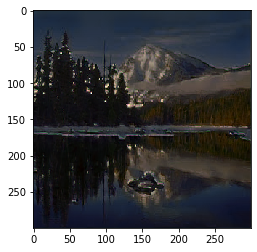

After 400 criterions:
Total loss:  392.64996337890625
Content loss:  1.2499366998672485
Style loss:  4.103189468383789


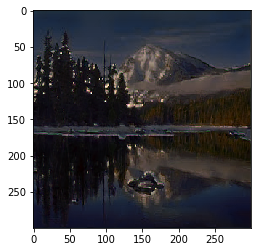

After 500 criterions:
Total loss:  380.8727111816406
Content loss:  1.1969103813171387
Style loss:  4.0267229080200195


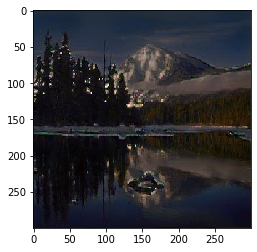

After 600 criterions:
Total loss:  364.8017578125
Content loss:  1.126700758934021
Style loss:  3.9159328937530518


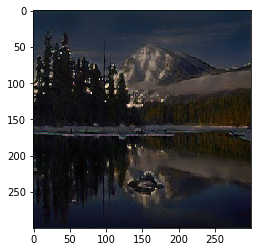

After 700 criterions:
Total loss:  354.748779296875
Content loss:  1.1162205934524536
Style loss:  3.74631404876709


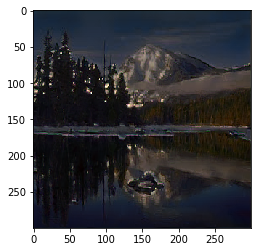

After 800 criterions:
Total loss:  358.193359375
Content loss:  1.097955584526062
Style loss:  3.8700003623962402


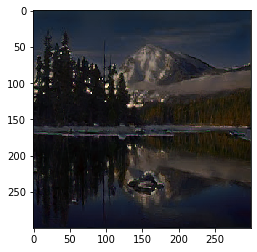

After 900 criterions:
Total loss:  341.998779296875
Content loss:  1.063369631767273
Style loss:  3.6498665809631348


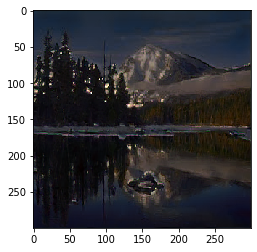

After 1000 criterions:
Total loss:  341.40765380859375
Content loss:  1.0632455348968506
Style loss:  3.638416290283203


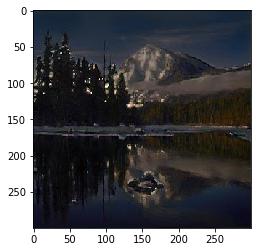

totally cost 39.061153411865234


In [52]:
time_start=time.time()
for epoch in range(0, steps+1):
    
    scheduler.step()

    target = style_net(content_image).to(device)
    target.requires_grad_(True)


    target_features = utils.get_features(target, VGG)  # extract output image's all feature maps
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2']) ** 2)
    
    style_loss = 0

    # compute each layer's style loss and add them
    for layer in style_weights:
        
        target_feature = target_features[layer]  # output image's feature map after layer
        target_gram_matrix = utils.get_grim_matrix(target_feature)
        style_gram_matrix = style_gram_matrixs[layer]
        
        #style_gram_matrix_2 = style_gram_matrixs_2[layer]
        
        layer_style_loss = style_weights[layer] * torch.mean((target_gram_matrix - style_gram_matrix) ** 2)
        
        #layer_style_loss_2 = style_weights[layer] * torch.mean((target_gram_matrix - style_gram_matrix_2) ** 2)
        #layer_style_loss += layer_style_loss_2
        #layer_style_loss = layer_style_loss/2
        
        b, c, h, w = target_feature.shape
        style_loss += layer_style_loss / (c * h * w)
    

    total_loss = content_weight * content_loss + style_weight * style_loss
    total_loss_epoch.append(total_loss)

    style_loss_epoch.append(style_weight * style_loss)
    content_loss_epoch.append(content_weight * content_loss)

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if epoch % show_every == 0:
        print("After %d criterions:" % epoch)
        print('Total loss: ', total_loss.item())
        print('Content loss: ', content_loss.item())
        print('Style loss: ', style_loss.item())
        plt.imshow(utils.im_convert(target))
        plt.show()

    output_image = target
time_end=time.time()
print('totally cost', time_end - time_start)

In [ ]:
# plot the line chart
epoch = range(0, steps + 1)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))                                                       

ax1.plot(epoch, total_loss_epoch)
ax1.set_title("Total loss")
ax1.set_xlabel("epoch")
ax1.set_ylabel("Total loss")

ax2.plot(epoch, style_loss_epoch)
ax2.set_title("Style loss")
ax2.set_xlabel("epoch")
ax2.set_ylabel("Style loss")

ax3.plot(epoch, content_loss_epoch)
ax3.set_title("Content loss")
ax3.set_xlabel("epoch")
ax3.set_ylabel("Content loss")


plt.show()

In [ ]:
# display the raw images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(utils.im_convert(content_image))
ax2.imshow(utils.im_convert(output_image))
plt.show()